<a href="https://colab.research.google.com/github/okayteakay/Image-Filters-Augmentation/blob/main/Filters.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### Import Libraries

In [58]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow import keras
from scipy.ndimage.filters import convolve
import cv2
import tkinter as tk
from tkinter import filedialog
from tkinter import *
from PIL import ImageTk
import dlib
import math
from math import hypot
from PIL import Image, ImageFilter
from PIL.ImageFilter import (
   BLUR, CONTOUR, DETAIL, EDGE_ENHANCE, EDGE_ENHANCE_MORE,
   EMBOSS, FIND_EDGES, SMOOTH, SMOOTH_MORE, SHARPEN)
from pylab import *
from numpy import expand_dims
from keras.preprocessing.image import load_img
from keras.preprocessing.image import img_to_array
from keras.preprocessing.image import ImageDataGenerator
import imgaug.augmenters as iaa
import os
from glob import glob
import imageio
import random

In [141]:
img1 = plt.imread('BMC.jpg')

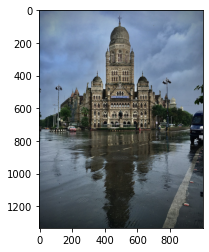

In [142]:
plt.imshow(img1)

In [4]:
images = np.array(
    [img1 for _ in range(32)], dtype=np.uint8)  # 32 means creat 32 enhanced images using following methods.

seq = iaa.Sequential(
    [
        iaa.Fliplr(0.5),  
        iaa.Crop(percent=(0, 0.1)),            
        iaa.Sometimes(0.5, iaa.GaussianBlur(sigma=(0, 0.5))),        
        iaa.ContrastNormalization((0.75, 1.5)),         
        iaa.AdditiveGaussianNoise(loc=0, scale=(0.0, 0.05 * 255), per_channel=0.5),    
        iaa.Multiply((0.8, 1.2), per_channel=0.2),
        iaa.Affine(
            scale={
                "x": (0.8, 1.2),
                "y": (0.8, 1.2)
            },
            translate_percent={
                "x": (-0.2, 0.2),
                "y": (-0.2, 0.2)
            },
            rotate=(-25, 25),
            shear=(-8, 8))
    ],
    random_order=True)  # apply augmenters in random order
images_aug = seq.augment_images(images)

In [5]:
images_aug.dtype

dtype('uint8')

In [6]:
for i in range(len(images_aug)):
  name = 'img' + str(i+1)
  plt.savefig(name)

<Figure size 432x288 with 0 Axes>



### Horizontal Shift

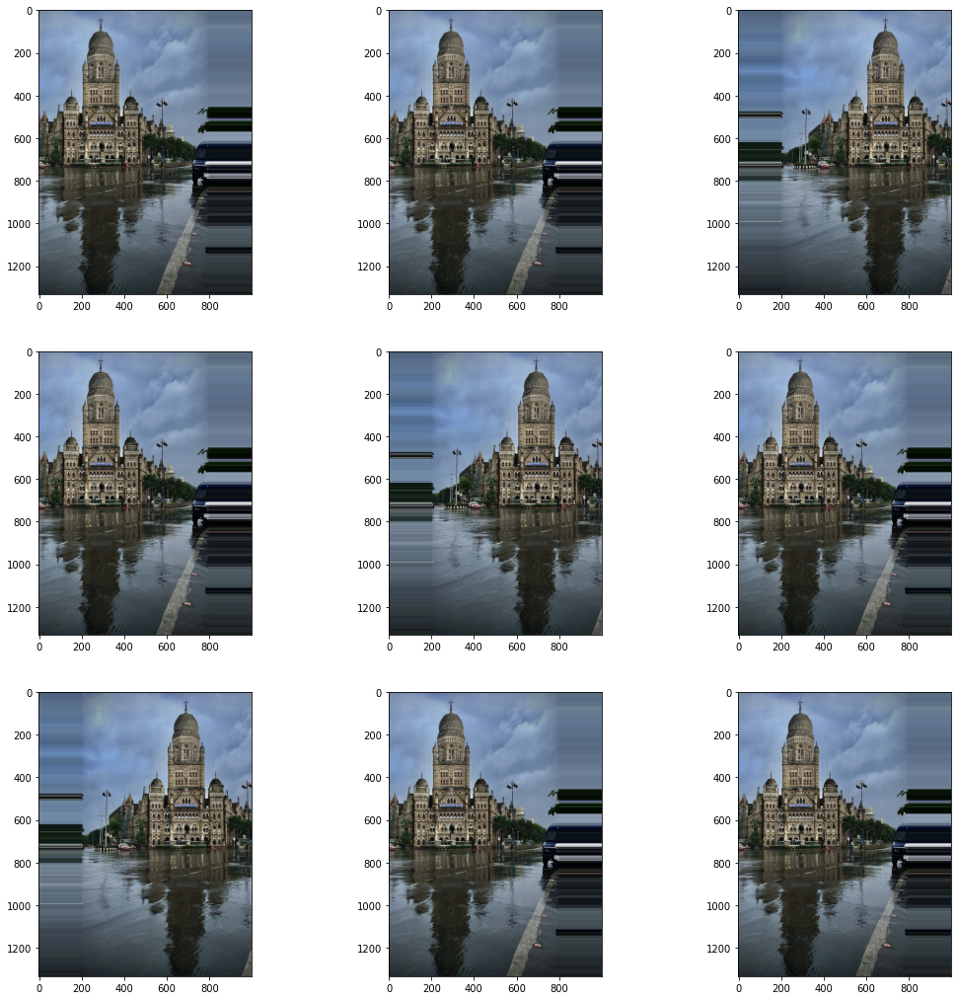

In [7]:
data = img_to_array(img1)
samples = expand_dims(data, 0)
datagen = ImageDataGenerator(width_shift_range=[-200,200])
it = datagen.flow(samples, batch_size=1)
f = plt.figure(figsize = (18, 18))
for i in range(9):
	plt.subplot(330 + 1 + i)
	batch = it.next()
	image = batch[0].astype('uint8')
	plt.imshow(image)
plt.show()

### Blur

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
  after removing the cwd from sys.path.


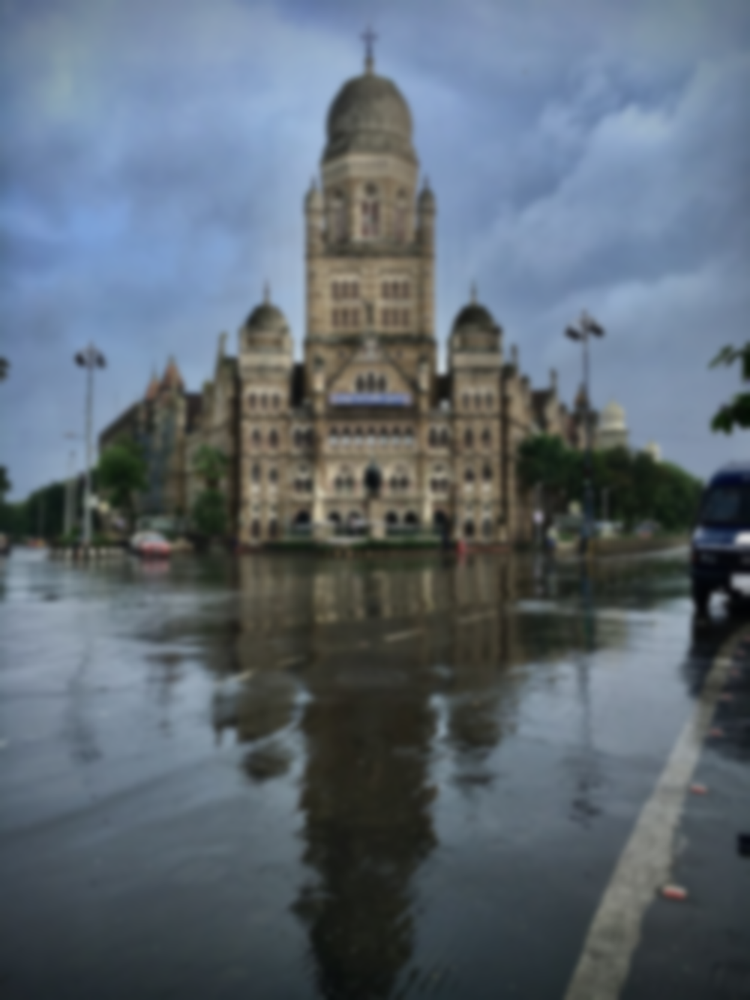

In [8]:
hsv = cv2.cvtColor(img1, cv2.COLOR_BGR2HSV)
mask = cv2.inRange(hsv, (0, 60, 30), (180, 255, 255))
blurred_img = cv2.GaussianBlur(img1, (25, 25), 0)
blur = np.where(mask == (255, 255, 255), img1, blurred_img)
blur = cv2.cvtColor(blur, cv2.COLOR_BGR2RGB)
from google.colab.patches import cv2_imshow
cv2_imshow(blur)

### Increase Size

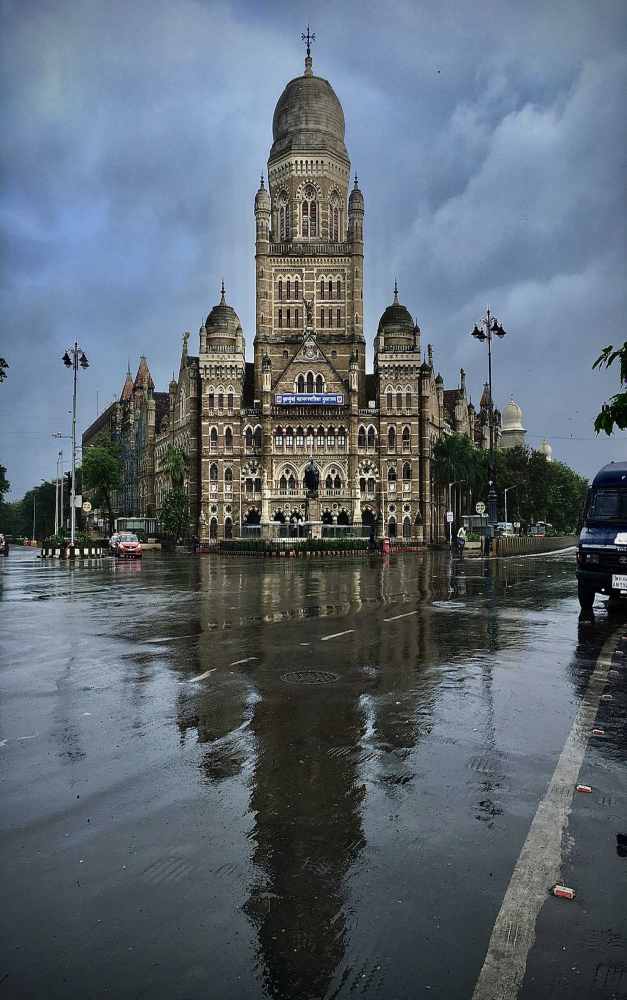

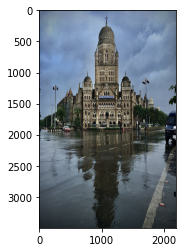

In [9]:
image = cv2.resize(img1, (2195, 3500))
imag = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
plt.imshow(image)
from google.colab.patches import cv2_imshow
cv2_imshow(imag)

### Cartoonification

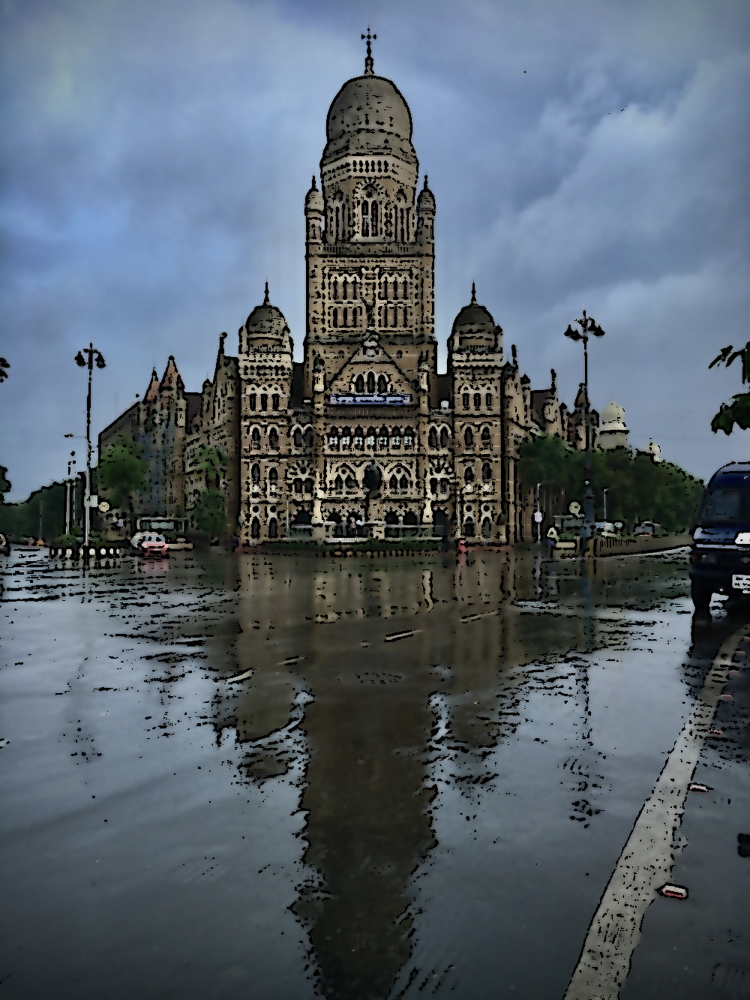

In [10]:
grey = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
smoothgrey = cv2.medianBlur(grey, 5)
getEdge = cv2.adaptiveThreshold(smoothgrey, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 9, 9)
colorImage = cv2.bilateralFilter(img1, 9, 300, 300)
colorImage = cv2.cvtColor(colorImage, cv2.COLOR_BGR2RGB)
cartoonify = cv2.bitwise_and(colorImage, colorImage, mask=getEdge)
cv2_imshow(cartoonify)

### Detail

In [11]:
img = Image.open('BMC.jpg')
detail = img.filter(DETAIL)
detail = detail.save('detail.jpg')


### Black Edges

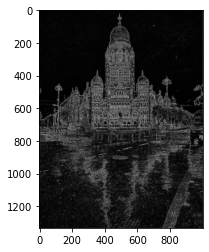

In [12]:
p = Image.open('BMC.jpg')
edge = p.filter(FIND_EDGES)
plt.imshow(edge)

### Sharpen

In [13]:
p = Image.open('BMC.jpg')
sharp = p.filter(SHARPEN)
sharp = sharp.resize((1800, 2500))
sharp = sharp.save('sharp.jpg')


### Green Contours

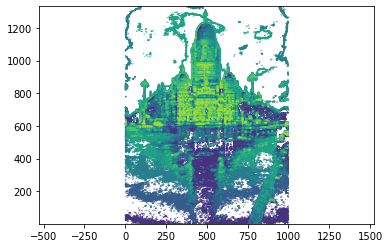

In [14]:
im = array(Image.open('BMC.jpg').convert('L'))
figure()
contour(im, origin='image')
axis('equal')
show()

### Ink Contours

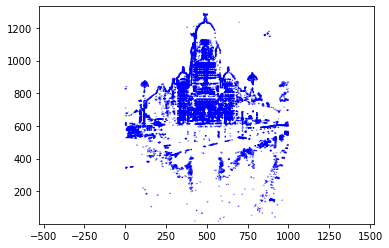

In [15]:
contour(im, levels=[180], colors='blue', origin='image')
axis('equal')
show()

### Vibrance 1

In [27]:
hsv1 = cv2.cvtColor(img1, cv2.COLOR_BGR2HSV)         # convert image to HSV color space
hsv1 = np.array(hsv1, dtype = np.float64)
hsv1[:,:,1] = hsv1[:,:,1]*1.25                        # scale pixel values up for channel 1
hsv1[:,:,1][hsv1[:,:,1]>255]  = 255
hsv1[:,:,2] = hsv1[:,:,2]*1.25                        # scale pixel values up for channel 2
hsv1[:,:,2][hsv1[:,:,2]>255]  = 255
hsv1 = np.array(hsv1, dtype = np.uint8)
vibrance1 = cv2.cvtColor(hsv1, cv2.COLOR_HSV2BGR)       # converting back to BGR used by OpenCV


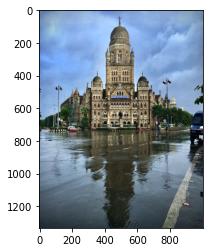

In [28]:
plt.imshow(vibrance1)

### Vibrance 2

In [29]:
hsv2 = cv2.cvtColor(img1, cv2.COLOR_BGR2HSV)         # convert image to HSV color space
hsv2 = np.array(hsv2, dtype = np.float64)
hsv2[:,:,1] = hsv2[:,:,1]*1.65                        # scale pixel values up for channel 1
hsv2[:,:,1][hsv2[:,:,1]>255]  = 255
hsv2[:,:,2] = hsv2[:,:,2]*1.65                        # scale pixel values up for channel 2
hsv2[:,:,2][hsv2[:,:,2]>255]  = 255
hsv2 = np.array(hsv2, dtype = np.uint8)
vibrance2 = cv2.cvtColor(hsv2, cv2.COLOR_HSV2BGR)       # converting back to BGR used by OpenCV


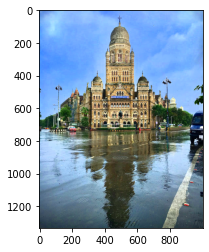

In [30]:
plt.imshow(vibrance2)

### Enhance 1

In [31]:
enhance1 = cv2.detailEnhance(img1, sigma_s=15, sigma_r=0.15)
#sigma_s controls how much the image is smoothed - the larger its value, 
#the more smoothed the image gets, but it's also slower to compute.
#sigma_r is important if you want to preserve edges while smoothing the image. 
#Small sigma_r results in only very similar colors to be averaged (i.e. smoothed), 
#while colors that differ much will stay intact.

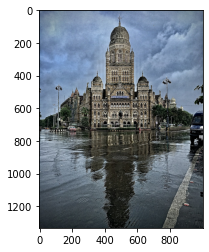

In [32]:
plt.imshow(enhance1)

### Enhance 2

In [33]:
enhance2 = cv2.detailEnhance(img1, sigma_s=30, sigma_r=0.5)
#sigma_s controls how much the image is smoothed - the larger its value, 
#the more smoothed the image gets, but it's also slower to compute.
#sigma_r is important if you want to preserve edges while smoothing the image. 
#Small sigma_r results in only very similar colors to be averaged (i.e. smoothed), 
#while colors that differ much will stay intact.

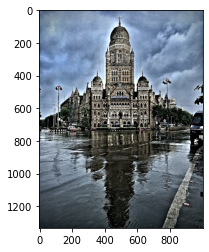

In [34]:
plt.imshow(enhance2)

### Bright

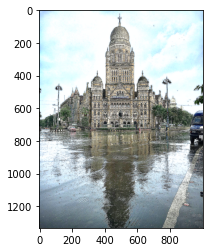

In [35]:
bright_kernel_sharpening = np.array([[-1,-1,-1], [-1, 10,-1],[-1,-1,-1]])
bright = cv2.filter2D(img1, -1, bright_kernel_sharpening)
plt.imshow(bright)

### Negative

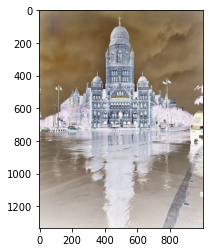

In [36]:
negative = cv2.bitwise_not(img1)
plt.imshow(negative)

### Cold 1 & 2

In [37]:

def gamma_function(channel, gamma):
    invGamma = 1/gamma
    table = np.array([((i / 255.0) ** invGamma) * 255
                      for i in np.arange(0, 256)]).astype("uint8") #creating lookup table
    channel = cv2.LUT(channel, table)
    return channel

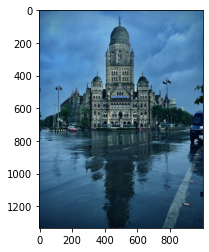

In [38]:
cold1 = img1.copy()
cold1[:, :, 0] = gamma_function(cold1[:, :, 0], 0.75) # down scaling blue channel
cold1[:, :, 2] = gamma_function(cold1[:, :, 2], 1.25) # up scaling red channel
hsv = cv2.cvtColor(cold1, cv2.COLOR_BGR2HSV)
hsv[:, :, 1] = gamma_function(hsv[:, :, 1], 1.2) # up scaling saturation channel
Cold1 = cv2.cvtColor(hsv, cv2.COLOR_HSV2BGR)
plt.imshow(Cold1)



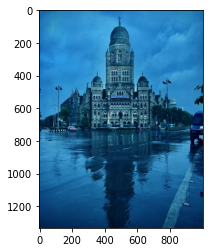

In [39]:
cold2 = img1.copy()
cold2[:, :, 0] = gamma_function(cold2[:, :, 0], 0.5) # down scaling blue channel
cold2[:, :, 2] = gamma_function(cold2[:, :, 2], 1.6) # up scaling red channel
hsv = cv2.cvtColor(cold2, cv2.COLOR_BGR2HSV)
hsv[:, :, 1] = gamma_function(hsv[:, :, 1], 1.4) # up scaling saturation channel
Cold2 = cv2.cvtColor(hsv, cv2.COLOR_HSV2BGR)
plt.imshow(Cold2)


### Hot 1 & 2

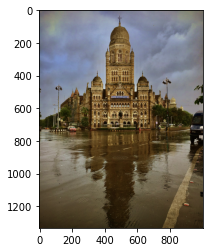

In [40]:
hot1 = img1.copy()
hot1[:, :, 0] = gamma_function(hot1[:, :, 0], 1.25) 
hot1[:, :, 2] = gamma_function(hot1[:, :, 2], 0.75) 
hsv = cv2.cvtColor(hot1, cv2.COLOR_BGR2HSV)
hsv[:, :, 1] = gamma_function(hsv[:, :, 1], 1.3) 
Hot1 = cv2.cvtColor(hsv, cv2.COLOR_HSV2BGR)
plt.imshow(Hot1)

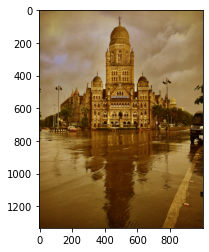

In [41]:
hot2 = img1.copy()
hot2[:, :, 0] = gamma_function(hot2[:, :, 0], 1.67) 
hot2[:, :, 2] = gamma_function(hot2[:, :, 2], 0.47) 
hsv = cv2.cvtColor(hot2, cv2.COLOR_BGR2HSV)
hsv[:, :, 1] = gamma_function(hsv[:, :, 1], 1.3) 
Hot2 = cv2.cvtColor(hsv, cv2.COLOR_HSV2BGR)
plt.imshow(Hot2)

### Gray

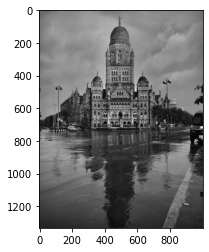

In [42]:
img3 = Image.open('BMC.jpg').convert('LA')
img3.save('greyscale.png')
plt.imshow(img3)

### Daylight

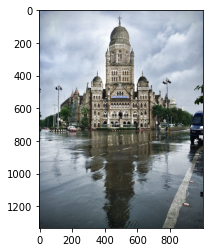

In [43]:
#HLS Colorspace - Hue, Lightness, Saturation 
image_HLS = cv2.cvtColor(img1,cv2.COLOR_BGR2HLS) # Conversion to HLS
image_HLS = np.array(image_HLS, dtype = np.float64)
daylight = 1.35
image_HLS[:,:,1] = image_HLS[:,:,1]*daylight # scale pixel values up for channel 1(Lightness)
image_HLS[:,:,1][image_HLS[:,:,1]>255]  = 255 # Sets all values above 255 to 255
image_HLS = np.array(image_HLS, dtype = np.uint8)
Daylight = cv2.cvtColor(image_HLS,cv2.COLOR_HLS2BGR) # Conversion to RGB
plt.imshow(Daylight)

### 90s BnW Noise TV

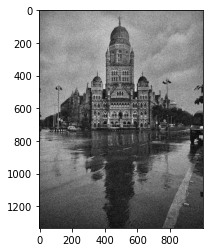

In [44]:
height, width = img1.shape[:2]
gray = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
thresh = 0.9 # creating threshold. This means noise will be added to 80% pixels
for i in range(height):
    for j in range(width):
        if np.random.rand() <= thresh:
            if np.random.randint(2) == 0:
                gray[i, j] = min(gray[i, j] + np.random.randint(0, 64), 255) # adding random value between 0 to 64. Anything above 255 is set to 255.
            else:
                gray[i, j] = max(gray[i, j] - np.random.randint(0, 64), 0) # subtracting random values between 0 to 64. Anything below 0 is set to 0.
plt.imshow(gray, cmap = 'gray')  


### BnW Contrast

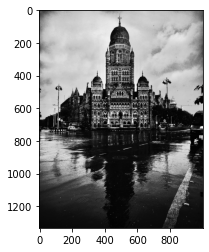

In [45]:
img = img1.copy()
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
xp = [0, 64, 112, 128, 144, 192, 255] # setting reference values
fp = [0, 16, 64, 128, 192, 240, 255] # setting values to be taken for reference values
x = np.arange(256)
table = np.interp(x, xp, fp).astype('uint8') # creating lookup table
contrast = cv2.LUT(gray, table) # changing values based on lookup table
plt.imshow(contrast, cmap='gray')
# from google.colab.patches import cv2_imshow
# cv2_imshow(contrast)

### Contrast

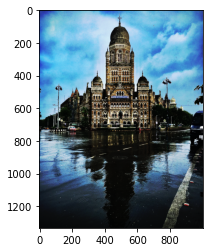

In [46]:
img = img1.copy()
xp = [0, 64, 112, 128, 144, 192, 255] # setting reference values
fp = [0, 16, 64, 128, 192, 240, 255] # setting values to be taken for reference values
x = np.arange(256)
table = np.interp(x, xp, fp).astype('uint8') # creating lookup table
contrast = cv2.LUT(img, table) # changing values based on lookup table
plt.imshow(contrast, cmap='gray')
# from google.colab.patches import cv2_imshow
# cv2_imshow(contrast)

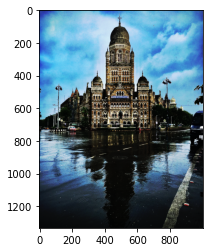

In [47]:
plt.imshow(contrast, cmap='Accent_r')

### Adaptive Threshold

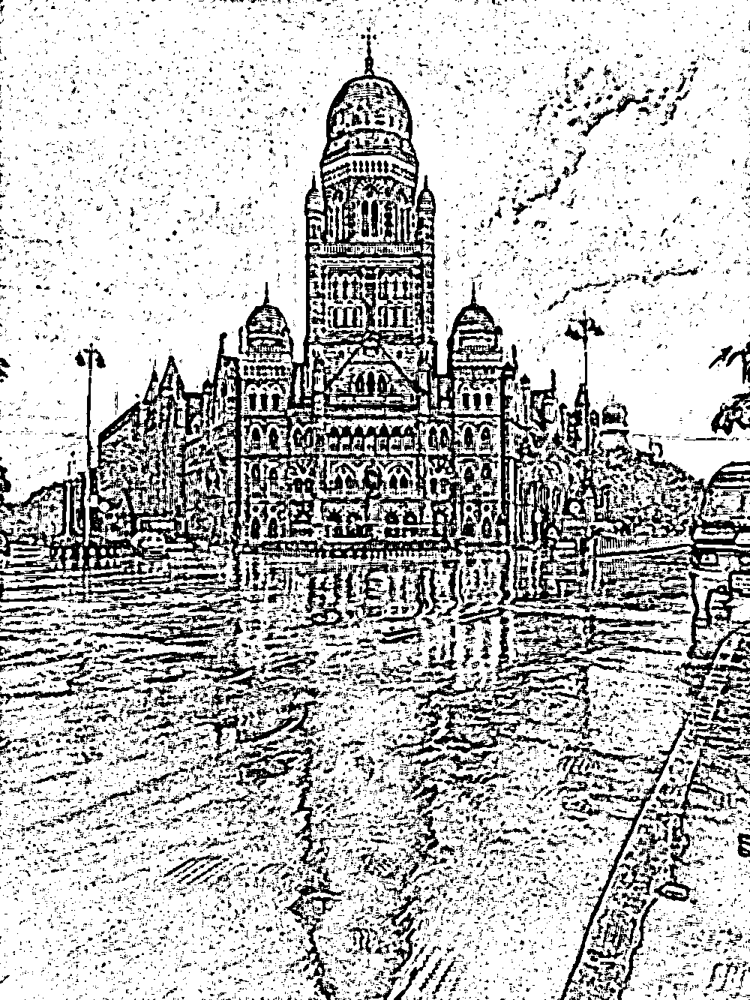

In [48]:
gray = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
img = cv2.medianBlur(gray,5)
thresh = cv2.adaptiveThreshold(img,255,cv2.ADAPTIVE_THRESH_MEAN_C,cv2.THRESH_BINARY,11,2)
# th3 = cv.adaptiveThreshold(img,255,cv.ADAPTIVE_THRESH_GAUSSIAN_C,\
#             cv.THRESH_BINARY,11,2)
cv2_imshow(thresh)


In [143]:
def snowflake(img, max_number, size = (10, 5), angle = 120, start_angle = 0, end_angle = 360, color = (200, 200, 200), fill = -1):
  loc = []
  shape = img.shape
  print(shape)
  for i in range(max_number):
    a = random.randint(0, shape[1])
    b = random.randint(0, shape[0])
    c = [a, b]
    if c not in loc:
      loc.append(c)
    else:
      continue
  final_img = img.copy()
  for i, l in enumerate(loc):
    final_img = cv2.ellipse(final_img, tuple(l), size, angle, start_angle, end_angle, color, fill)
  return final_img

In [144]:
a = snowflake(img1,155)

(1333, 1000, 3)


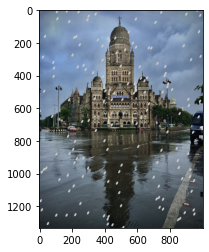

In [145]:
plt.imshow(a)

In [146]:
img2 = plt.imread('BMC.jpg')

In [147]:
def rain(img, max_number, length = 15, angle = (5 * np.pi)/4, color = (150, 150, 200), thickness = 2):
  loc = []
  shape = img.shape
  for i in range(max_number):
    a = random.randint(0, shape[1])
    b = random.randint(0, shape[0])
    c = [a, b]
    if c not in loc:
      loc.append(c)
    else:
      continue
  
  final_img = img.copy()
  loc2 = []
  for i, l in enumerate(loc):
    p1 = np.floor(l[0] + (np.sin(angle) * length))
    p2 = np.floor(l[1] + (np.sin(angle) * length))
    loc2.append([l[0], l[1], int(p1), int(p2)])

  
  for i, l in enumerate(loc2):
    final_img = cv2.line(final_img, tuple(l[: 2]), tuple(l[2:]), color, thickness)  
    
  return final_img

In [148]:
f = rain(img2, 130, 75, thickness = 2)

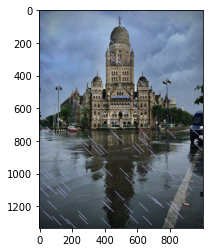

In [149]:
plt.imshow(f)